# **Выполнение проекта по ПП "Реализация проектов в сфере DS"**
**Задача регрессии.**

Импортируем необходимые библиотеки.

In [31]:
import numpy as np
import pandas as pd
import matplotlib as mpl
import seaborn as sns
import warnings
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler

from matplotlib import pyplot as plt

Добавим фильтры на игнорирование лишних предупреждений при выводе

In [2]:
warnings.filterwarnings('ignore')
warnings.simplefilter(action = "ignore", category = FutureWarning)
plt.rcParams['figure.dpi'] = 400
plt.style.use("seaborn-v0_8-deep")
%matplotlib inline

In [3]:
mpl.style.available

['Solarize_Light2',
 '_classic_test_patch',
 '_mpl-gallery',
 '_mpl-gallery-nogrid',
 'bmh',
 'classic',
 'dark_background',
 'fast',
 'fivethirtyeight',
 'ggplot',
 'grayscale',
 'seaborn-v0_8',
 'seaborn-v0_8-bright',
 'seaborn-v0_8-colorblind',
 'seaborn-v0_8-dark',
 'seaborn-v0_8-dark-palette',
 'seaborn-v0_8-darkgrid',
 'seaborn-v0_8-deep',
 'seaborn-v0_8-muted',
 'seaborn-v0_8-notebook',
 'seaborn-v0_8-paper',
 'seaborn-v0_8-pastel',
 'seaborn-v0_8-poster',
 'seaborn-v0_8-talk',
 'seaborn-v0_8-ticks',
 'seaborn-v0_8-white',
 'seaborn-v0_8-whitegrid',
 'tableau-colorblind10']

## **1. EDA и RESEARCH Анализ**

Выполним выгрузку данных из .csv файла

In [4]:
data = pd.read_csv("dataset.csv")

Выведем главную сводку по содержанию датасета

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 114000 entries, 0 to 113999
Data columns (total 21 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   Unnamed: 0        114000 non-null  int64  
 1   track_id          114000 non-null  object 
 2   artists           113999 non-null  object 
 3   album_name        113999 non-null  object 
 4   track_name        113999 non-null  object 
 5   popularity        114000 non-null  int64  
 6   duration_ms       114000 non-null  int64  
 7   explicit          114000 non-null  bool   
 8   danceability      114000 non-null  float64
 9   energy            114000 non-null  float64
 10  key               114000 non-null  int64  
 11  loudness          114000 non-null  float64
 12  mode              114000 non-null  int64  
 13  speechiness       114000 non-null  float64
 14  acousticness      114000 non-null  float64
 15  instrumentalness  114000 non-null  float64
 16  liveness          11

Выведем первые элементы датасета

In [ ]:
data.head()

,Unnamed: 0,track_id,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,...,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,0,5SuOikwiRyPMVoIQDJUgSV,Gen Hoshino,Comedy,Comedy,73,230666,False,0.676,0.4610,...,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,acoustic
1,1,4qPNDBW1i3p13qLCt0Ki3A,Ben Woodward,Ghost (Acoustic),Ghost - Acoustic,55,149610,False,0.420,0.1660,...,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,acoustic
2,2,1iJBSr7s7jYXzM8EGcbK5b,Ingrid Michaelson;ZAYN,To Begin Again,To Begin Again,57,210826,False,0.438,0.3590,...,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,acoustic
3,3,6lfxq3CG4xtTiEg7opyCyx,Kina Grannis,Crazy Rich Asians (Original Motion Picture Sou...,Can't Help Falling In Love,71,201933,False,0.266,0.0596,...,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,acoustic
4,4,5vjLSffimiIP26QG5WcN2K,Chord Overstreet,Hold On,Hold On,82,198853,False,0.618,0.4430,...,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,acoustic


Рассмотрим содержащиеся данные:
- ***Unnamed: 0*** — идентификатор записи;
- ***track_id*** — идентификатор трека;
- ***artist*** — артист;
- ***album_name*** — название альбома;
- ***track_name*** — название записи;
- ***popularity*** — значения в диапазоне от 0 до 100 отражающее популярность песни;
- ***duration_ms*** — длительность трека(мс);
- ***explicit*** — ненормативная лексика;
- ***danceability*** — значение в диапазоне от 0 до 1 отражающее насколько песня подходит для танцев;
- ***energy*** — значение в диапазоне от 0 до 1 отражающее меру энергичности трека;
- ***key*** — общая тональность произведения;
- ***loudness*** — общая громность трека в дБ;
- ***mode*** — указывается лад;
- ***speechiness*** — определяет наличие произнесённых слов в треке от 0 до 1;
- ***acousticness*** — является ли трек акустическим от 0 до 1;
- ***instrumentalness*** — содержит ли трек вокальные партии;
- ***liveness*** — отражает живую запись;
- ***valence*** — позитивность трека;
- ***tempo*** — темп трека BPM;
- ***time_signature*** — знак нотации, характеризующий число ритмических единиц в такте;
- ***track_genre*** — жанр трека.

Исходя из этого удалим колонки *Unnamed* и *track_id* так как они просто выступают некими индексаторами.

In [8]:
data = data.drop(columns=["Unnamed: 0", "track_id"])

Проверим на Null Values

In [9]:
data.isnull().sum()

,0
artists,1
album_name,1
track_name,1
popularity,0
duration_ms,0
explicit,0
danceability,0
energy,0
key,0
loudness,0


Такие записи были найдены, просто отчистим их, чтобы не получить ошибок в дальнейшем (учитывая, что при проверке выяснилось, что это 1 запись)

In [10]:
data.dropna(inplace=True)

Теперь проверим данные на наличие дубликатов

In [11]:
data.duplicated().sum()

577

Было найдено всего 577 дублирующих записей, их тоже почистим.

In [12]:
data.drop_duplicates(inplace=True)

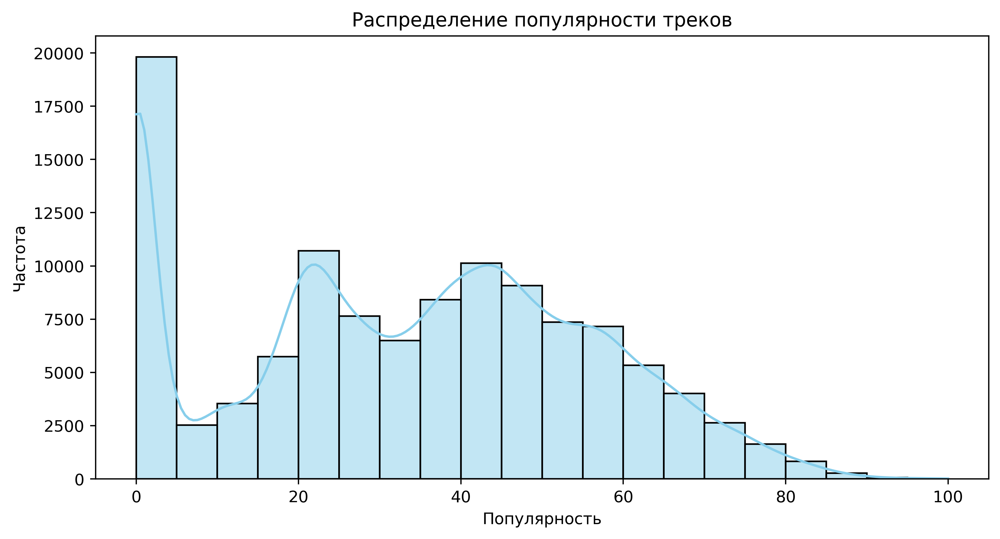

In [13]:
plt.figure(figsize=(10, 5))
sns.histplot(data['popularity'], bins=20, kde=True, color="skyblue")
plt.title('Распределение популярности треков')
plt.xlabel('Популярность')
plt.ylabel('Частота')
plt.show()

### **Визуализация**
Нарисуем график распределения количества песен от длительности(мин)

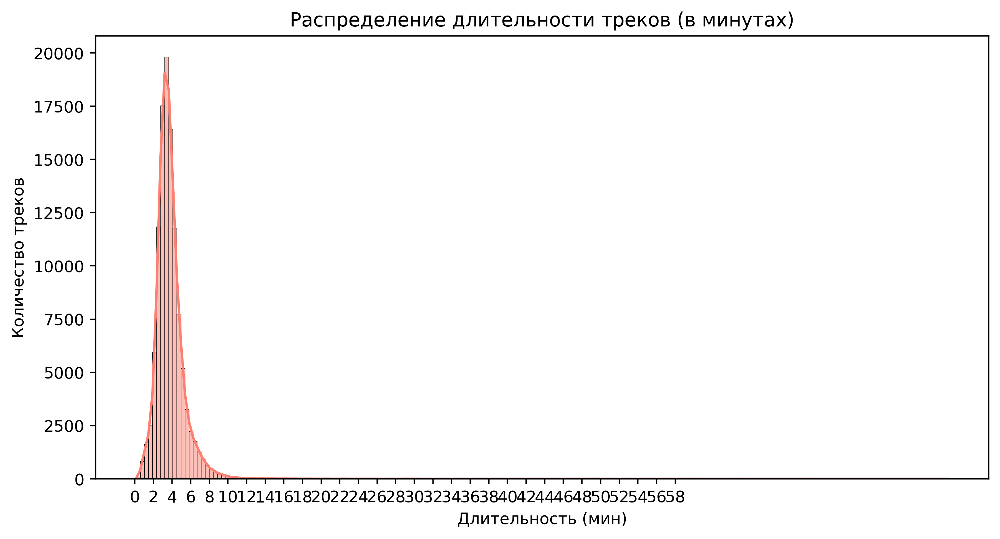

In [14]:
plt.figure(figsize=(10, 5))
sns.histplot(data['duration_ms'] / 60000, bins=200, kde=True, color="salmon")  # Длительность в минутах
plt.title('Распределение длительности треков (в минутах)')
plt.xlabel('Длительность (мин)')
plt.ylabel('Количество треков')
plt.xticks(range(0, 60, 2))
plt.show()

**Вывод:** *для большинства треков длительность составляет от 2 до 4-х минут. Что в принципе является закономерным для песен.*

Построим график для сравнения количества треков по ненормативной лексике.

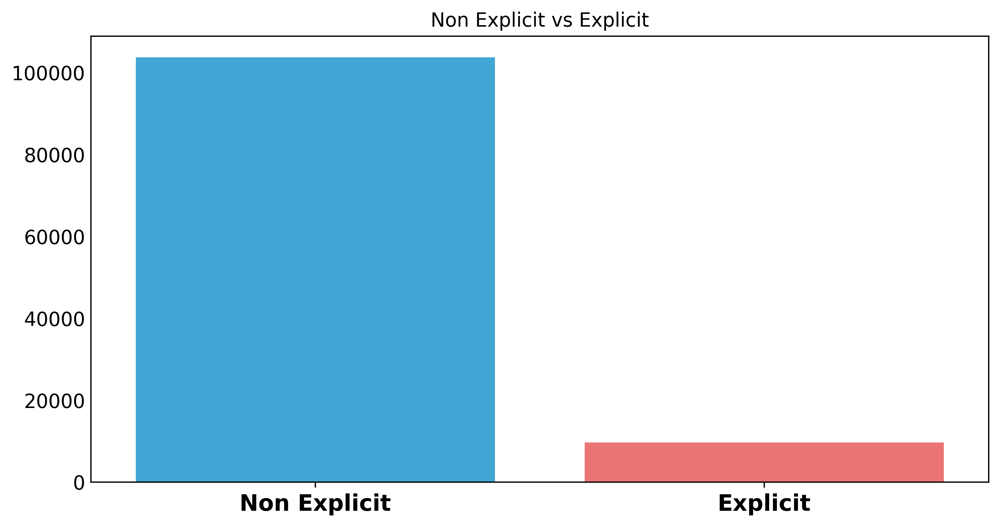

In [15]:
fig = plt.figure(figsize=(10, 5), facecolor='white')

sns.countplot(x = 'explicit', data = data, zorder=2, alpha=1, palette=['#28b0eb', '#ff6161'])


plt.xlabel('',)
plt.xticks([0, 1], ['Non Explicit', 'Explicit'], fontsize=12, fontweight='bold')
plt.tick_params(axis='x', labelsize=14)
plt.tick_params(axis = 'y', length=0, labelsize=12)
plt.title("Non Explicit vs Explicit")
plt.ylabel('',)

plt.show()

**Вывод:** *В около 96% песен не используется ненормативная лексика*

Построим график для выявления наиболее популярных жанров.

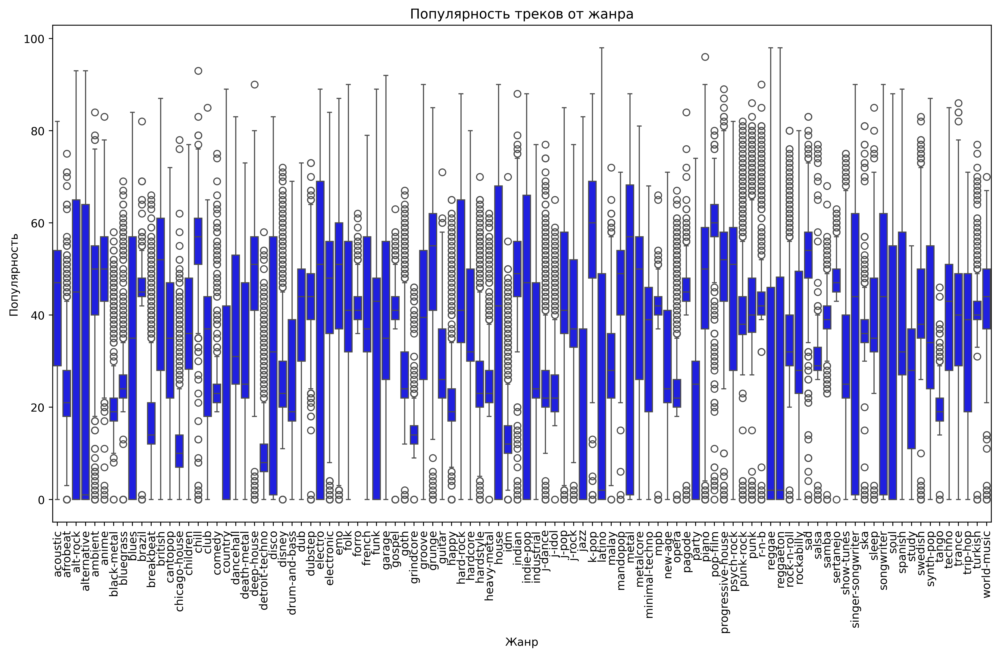

In [16]:
top_geners = data["track_genre"].value_counts().head(100).index


plt.figure(figsize=(15, 8))
sns.boxplot(x="track_genre", y="popularity", color="blue", data=data[data['track_genre'].isin(top_geners)])
plt.xticks(rotation=90)
plt.xlabel("Жанр")
plt.ylabel("Популярность")
plt.title('Популярность треков от жанра')
plt.show()

**Вывод:** *наиболее популярными являются k-pop и pop-film по медианому значению.*

Построим распределение для зависимости популярности от танцевальности песни.

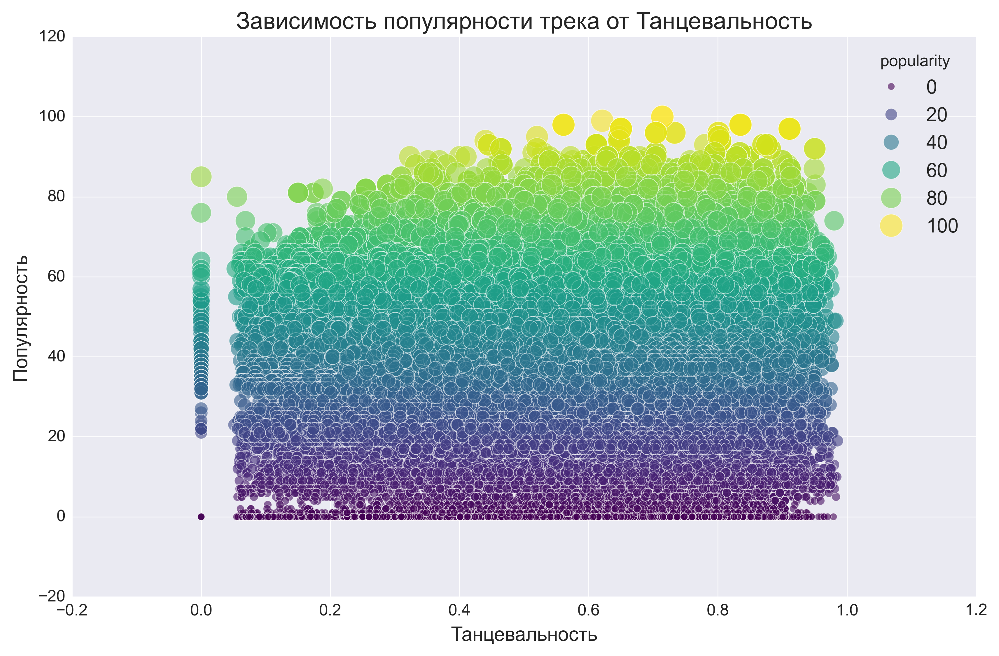

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=data, x='danceability', y='popularity', hue='popularity', palette='viridis', size='popularity', sizes=(20, 200), alpha=0.6)

plt.title('Зависимость популярности трека от Танцевальность')
plt.xlabel('Танцевальность')
plt.ylabel('Популярность')
plt.show()

**Вывод:** *Сложно сдлеать какой то особенный вывод помимо того, что самые популярные треки имеют не менее 0.5 по признаку танцевальности*

Также проверим, как использование ненормативной лексики влияет на популятность трека.

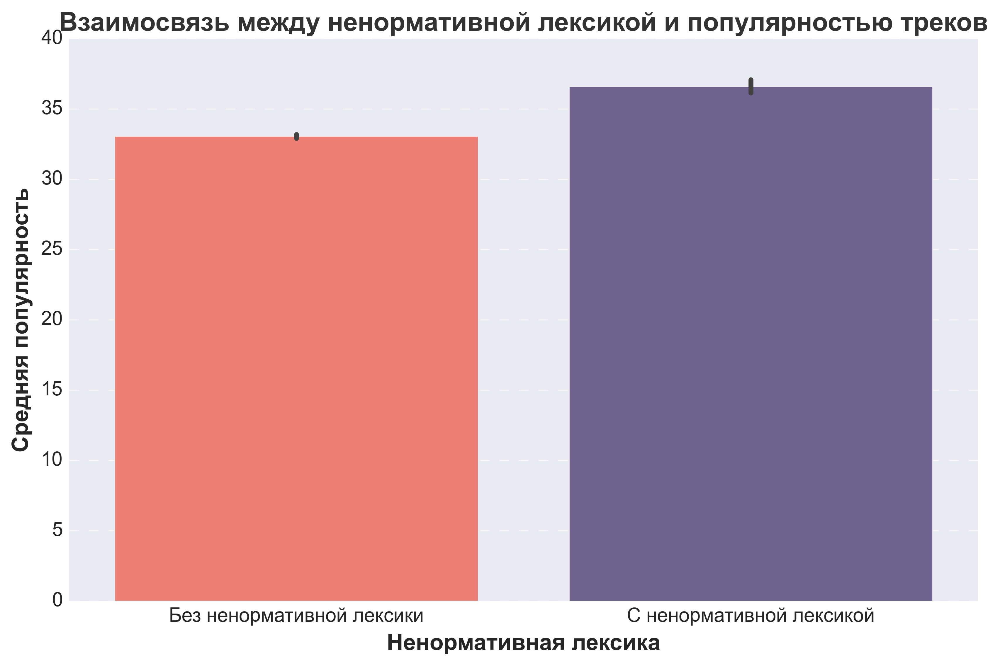

In [ ]:
plt.figure(figsize=(10, 6))
sns.barplot(x='explicit', y='popularity', data=data, palette=['#FF6F61', '#6B5B95'])
plt.title('Взаимосвязь между ненормативной лексикой и популярностью треков', fontsize=16, fontweight='bold', color='#333333')
plt.xlabel('Ненормативная лексика', fontsize=14, fontweight='semibold')
plt.ylabel('Средняя популярность', fontsize=14, fontweight='semibold')
plt.xticks([0, 1], ['Без ненормативной лексики', 'С ненормативной лексикой'], fontsize=12)
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

**Вывод:** *Можно точно сказать, что использование ненормативной лексики напрямую не влияет на популярность*

Также хорошо было бы рассмотреть средние велечины зависимости популярности от темпа.

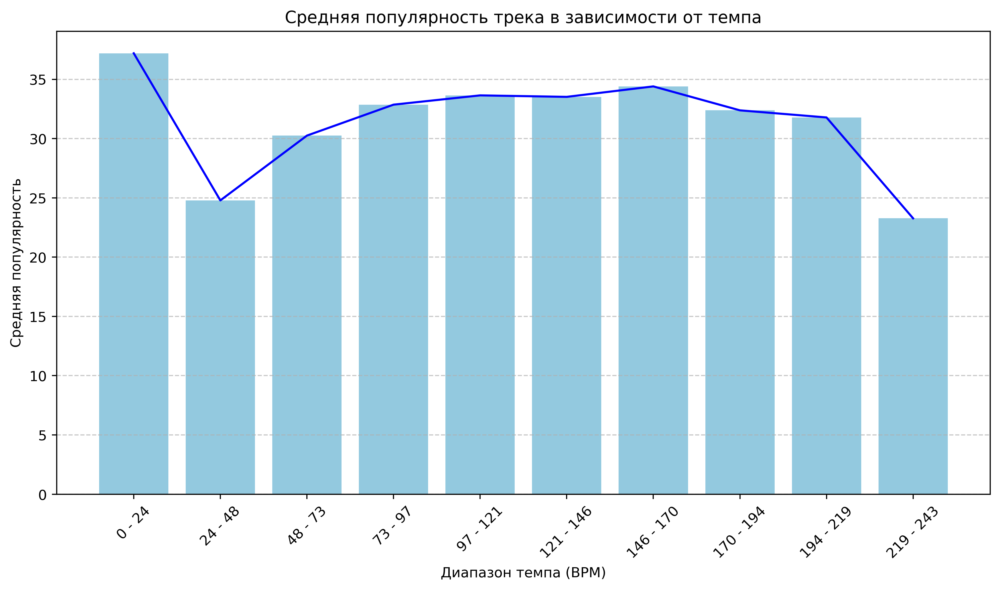

In [17]:
tempo_popularity = data.groupby(pd.cut(data['tempo'], bins=10)).popularity.mean().reset_index()

tempo_popularity['tempo'] = tempo_popularity['tempo'].apply(lambda x: f"{int(x.left)} - {int(x.right)}")

plt.figure(figsize=(12, 6))
sns.barplot(x=tempo_popularity['tempo'], y=tempo_popularity['popularity'], color='skyblue')
sns.lineplot(data=tempo_popularity, x=tempo_popularity['tempo'], y='popularity', color='blue')
plt.title('Средняя популярность трека в зависимости от темпа')
plt.xlabel('Диапазон темпа (BPM)')
plt.ylabel('Средняя популярность')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

**Вывод:** *Из диаграммы можно сказать, что наиболее популярны медленные треки, но на самом деле, так вышло из-за количества записей с такими значениями. Можно сказать, что диапазон 97-121 наиболее актуальный*

Для обратотки значений приведём их к численному типу данных

In [18]:
cat_cols = data.select_dtypes(include=["object", "bool"]).columns

for col in cat_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])

data.head()

,artists,album_name,track_name,popularity,duration_ms,explicit,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,time_signature,track_genre
0,10357,8100,11741,73,230666,0,0.676,0.4610,1,-6.746,0,0.1430,0.0322,0.000001,0.3580,0.715,87.917,4,0
1,3287,14796,22528,55,149610,0,0.420,0.1660,1,-17.235,1,0.0763,0.9240,0.000006,0.1010,0.267,77.489,4,0
2,12397,39162,60774,57,210826,0,0.438,0.3590,0,-9.734,1,0.0557,0.2100,0.000000,0.1170,0.120,76.332,4,0
3,14839,8580,9580,71,201933,0,0.266,0.0596,0,-18.515,1,0.0363,0.9050,0.000071,0.1320,0.143,181.740,3,0
4,5255,16899,25689,82,198853,0,0.618,0.4430,2,-9.681,1,0.0526,0.4690,0.000000,0.0829,0.167,119.949,4,0


Теперь когда мы имеем численные представления ключей, можем представить график корелляции между всеми признаками

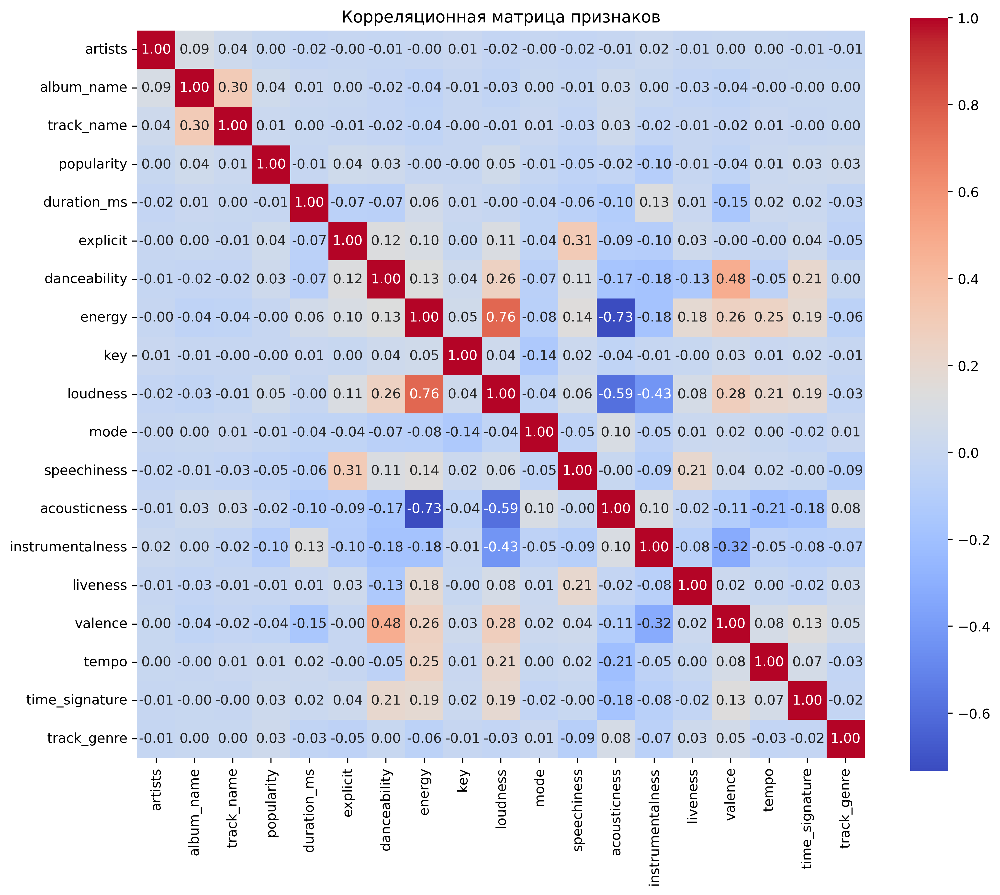

In [19]:
plt.figure(figsize=(12, 10))
correlation_matrix = data.corr()
sns.heatmap(correlation_matrix, annot=True, fmt=".2f", cmap="coolwarm", square=True)
plt.title('Корреляционная матрица признаков')
plt.show()

**Вывод:**
* Мы видим сильную корреляцию(0.76) между признаками *energy* и *loudness*. Это означает, что треки с высокой громкостью являются и более энергичными;
* Также можем наблюдать отрицательную корреляцию(-0.73) у признаков *energy* и *acousticness*. То есть, чем более акустичной является песня, тем менее она будет энергичной;
* Посмотрев на *loudness* и *acousticness*/*loudness* и *instrumentalness* можно заметить также отрицательную корреляцию(-0.59) и (-0.43), значит что громкие треки являются менее акустичными и инструментальными;
* Для *danceability* и *valence* можно заметить корреляцию в размере (0.48). Позитивность и танцевальность трека взаимозависимы;
* Из более очевидного, можно выделить не сильную корреляцию *explicit* и *speechiness* (0.31), что естественно, в треке с меньшим количеством слов - меньше ненормативной лексики.

Для числовых переменных можно использовать метод межквартильного размаха (IQR) или проверку на значения, выходящие за определенные логичные границы (например, продолжительность трека не должна быть отрицательной или выше определенного порога).

In [20]:
def removeOutliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    median = df[column].median()
    df[column] = df[column].apply(lambda x: median if (x <= lower_bound or x >= upper_bound) else x)
    return df

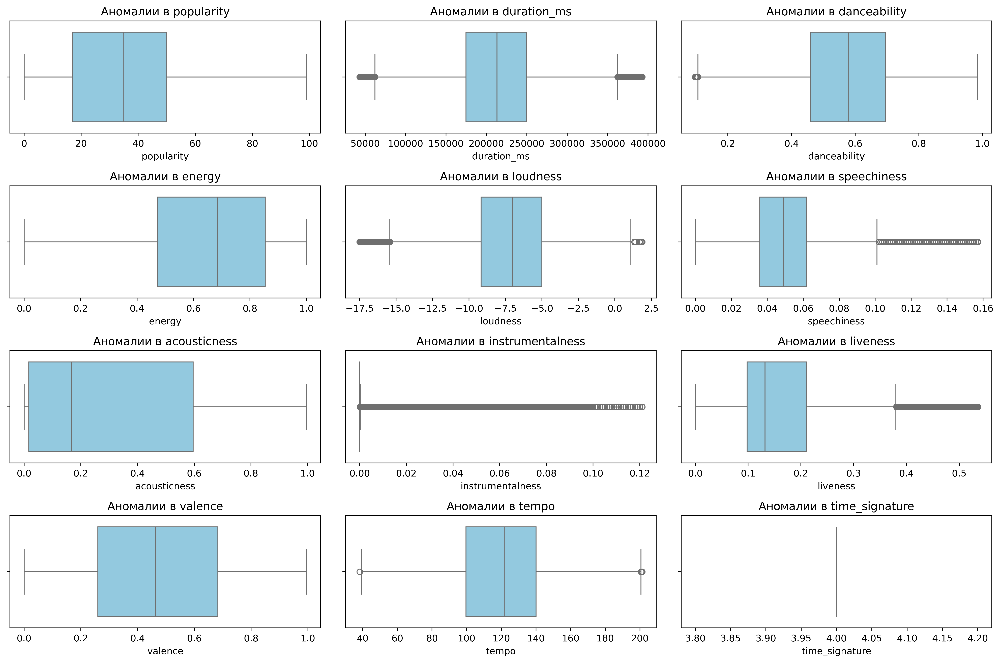

In [21]:
numerical_features = [
    'popularity', 'duration_ms', 'danceability', 'energy',
    'loudness', 'speechiness', 'acousticness', 'instrumentalness',
    'liveness', 'valence', 'tempo', 'time_signature'
]
for feature in numerical_features:
    if feature in data.columns:
        data = removeOutliers(data, feature)

plt.figure(figsize=(15, 10))
for i, feature in enumerate(numerical_features, 1):
    if feature in data.columns:
        plt.subplot(4, 3, i)
        sns.boxplot(data=data, x=feature, color='skyblue')
        plt.title(f'Аномалии в {feature}')
        plt.xlabel(feature)

plt.tight_layout()
plt.show()

# 2. Feature Engineering, Feature Importances и простая модель

Приведем числовые признаки к единому масштабу

In [22]:
scaler = StandardScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

Преобразуем все признаки к числовому типу данных

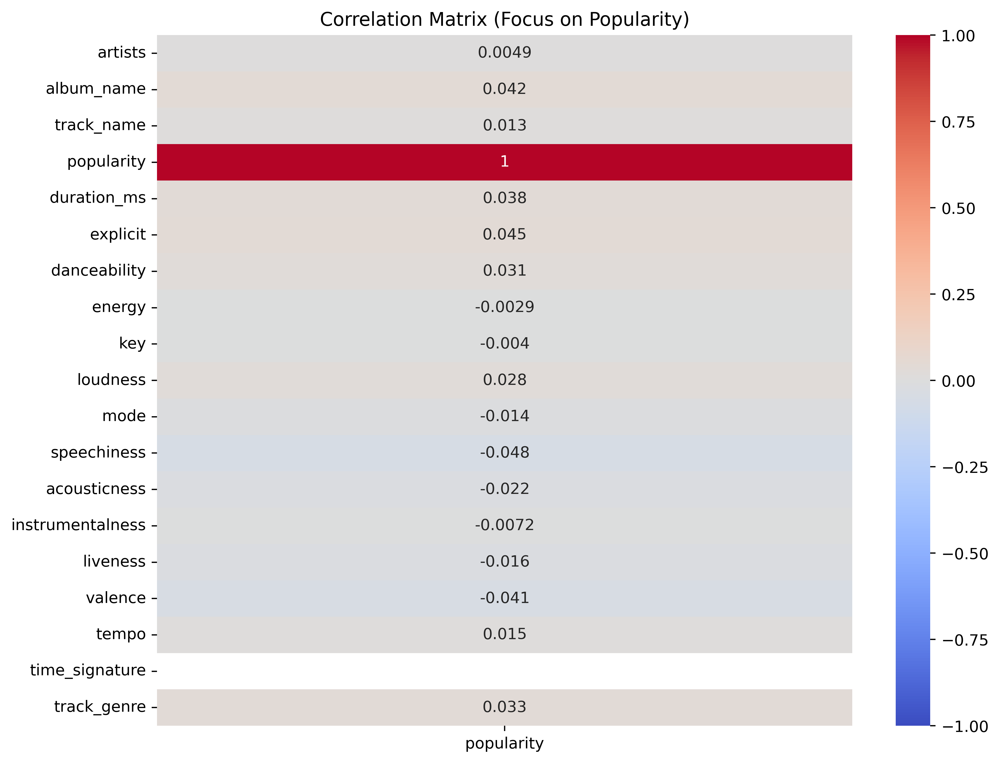

In [23]:
corr = data.corr()

popularity_corr = corr["popularity"].sort_values(ascending=False)

plt.figure(figsize=(10, 8))
sns.heatmap(corr[['popularity']], annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Matrix (Focus on Popularity)')
plt.show()

Корреляция между artists, energy, key и популярностью очень мала.
При этом признак key не выделяет музыкальный трек среди других, у признака energy есть соответсвующие loudness, tempo, danceability.
Также, даже если трек написан известным певцом, то это не значит, что песня станет популярной.

Из-за низкой корреляции эти признаки можно удалить из набора данных.

In [24]:
data = data.drop(columns=["artists", "energy", "key"])

In [26]:
X = data.drop(columns=['popularity'])
y = data['popularity']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

model = RandomForestRegressor(n_estimators=20, max_depth=10, random_state=42)
model.fit(X_train, y_train)

importances = model.feature_importances_
feature_names = X.columns
feature_importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances}).sort_values(by='Importance', ascending=False)

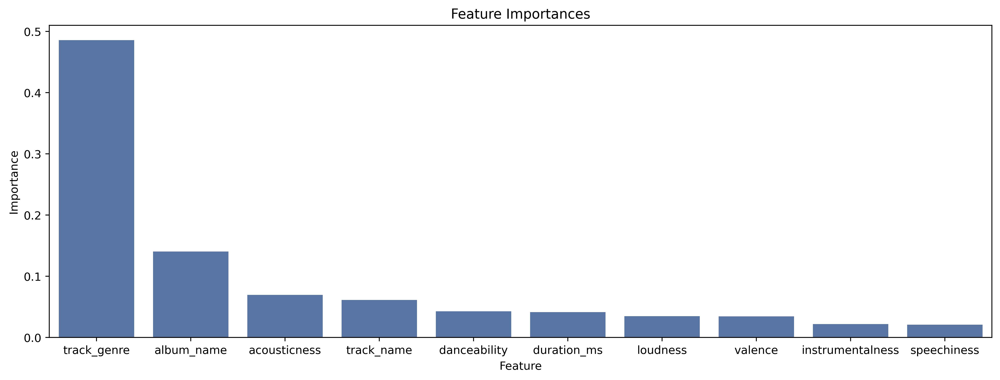

In [30]:
plt.figure(figsize=(15, 5))
sns.barplot(x='Feature', y='Importance', data=feature_importance_df.head(10))
plt.title('Feature Importances')
plt.show()

Судя по Feature Importance, трековый жанр является важным признаком.

### Создание простой модели

In [34]:
y_pred = model.predict(X_test)

mean_abs_error = mean_absolute_error(y_test, y_pred)
mean_sq_error = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("Mean Absolute Error: " + str(round(mean_abs_error, 3)))
print("Mean Squared Error: " + str(round(mean_sq_error, 3)))
print("R-squared: " + str(round(r2, 3)))

Mean Absolute Error: 0.662
Mean Squared Error: 0.725
R-squared: 0.28
